In [65]:
import librosa as librosa
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
%matplotlib inline
import librosa.display
from IPython.display import Audio
import pandas as pd
import os
import math
from sklearn.model_selection import train_test_split

In [78]:
audio_path= '/Users/odysseaslazaridis/Documents/GroupProject/babyslakh_16k/Track00001/mix.wav'

/var/folders/4b/3rzh912d6sn1gy_65xhgt5br0000gn/T/ipykernel_7842/1559298045.py:2: FutureWarning: waveshow() keyword argument 'x_axis' has been renamed to 'axis' in version 0.10.0.
	This alias will be removed in version 1.0.
  librosa.display.waveshow(y, sr= sr, x_axis='s')


The sampled audio is returned as a numpy array (time series) and has  (7729832,)  number of samples
The 10 randomly picked consequitive samples of the audio are:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


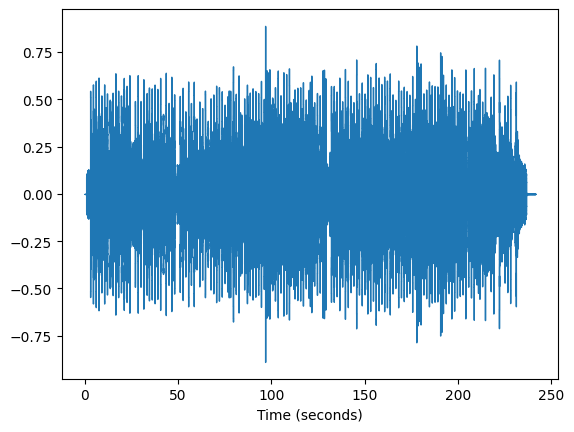

In [79]:
y, sr = librosa.load(audio_path, sr=32000)
librosa.display.waveshow(y, sr= sr, x_axis='s')
print("The sampled audio is returned as a numpy array (time series) and has ", y.shape, " number of samples")
print("The 10 randomly picked consequitive samples of the audio are: ", y[3000:3010])

In [80]:
# Hear the audio
Audio(audio_path)

In [81]:
# Size of the Fast Fourier Transform (FFT), which will also be used as the window length
n_fft=1024

# Step or stride between windows. If the step is smaller than the window length, the windows will overlap
hop_length=320

# Specify the window type for FFT/STFT
window_type ='hann'

# Calculate the spectrogram as the square of the complex magnitude of the STFT
spectrogram_librosa = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length, win_length=n_fft, window=window_type)) ** 2

print("The shape of spectrogram_librosa is: ", spectrogram_librosa.shape)
print("The size of the spectrogram is ([(frame_size/2) + 1 x number of frames])")
print("The frame size that we have specified is the number of samples to consider for the STFT. In our case, it is equal to the n_fft",n_fft, " samples")
print("The number of frames depends on the total length of the sampled signal, the number of samples in each frame and the hop length.")

The shape of spectrogram_librosa is:  (513, 24156)
The size of the spectrogram is ([(frame_size/2) + 1 x number of frames])
The frame size that we have specified is the number of samples to consider for the STFT. In our case, it is equal to the n_fft 1024  samples
The number of frames depends on the total length of the sampled signal, the number of samples in each frame and the hop length.


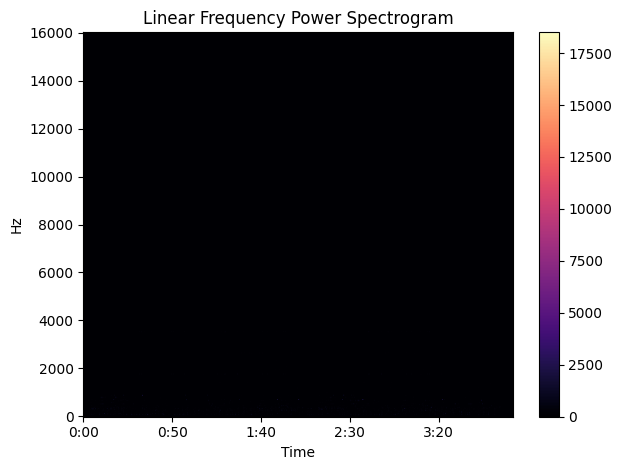

In [82]:
librosa.display.specshow(spectrogram_librosa, sr=sr, x_axis='time', y_axis='linear',hop_length=hop_length)
plt.title('Linear Frequency Power Spectrogram')
plt.colorbar()
plt.tight_layout()
plt.show()

The shape of mel spectrogram is:  (64, 24156)


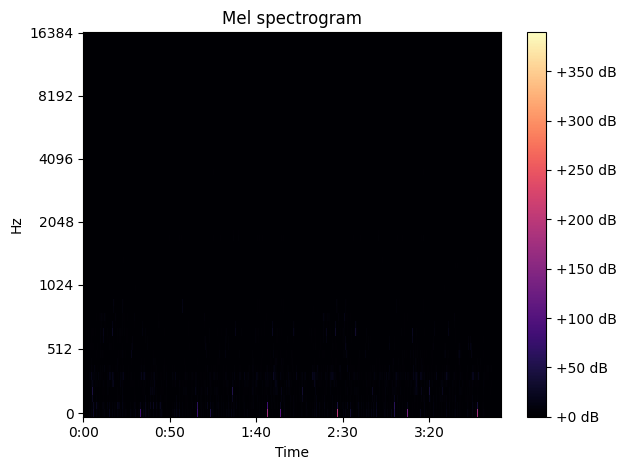

In [83]:
mel_bins = 64 # Number of mel bands
fmin = 0
fmax= None
Mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length, win_length=n_fft, window=window_type, n_mels = mel_bins, power=2.0)
print("The shape of mel spectrogram is: ", Mel_spectrogram.shape)

librosa.display.specshow(Mel_spectrogram, sr=sr, x_axis='time', y_axis='mel',hop_length=hop_length)
plt.colorbar(format='%+2.0f dB')
plt.title('Mel spectrogram')
plt.tight_layout()
plt.show()

The shape of Log Mel spectrogram is:  (64, 24156)


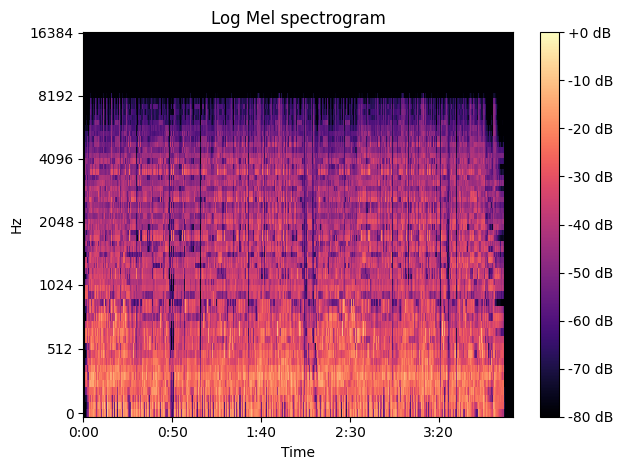

In [84]:
mel_spectrogram_db = librosa.power_to_db(Mel_spectrogram, ref=np.max)
print("The shape of Log Mel spectrogram is: ", mel_spectrogram_db.shape)
librosa.display.specshow(mel_spectrogram_db, sr=sr, x_axis='time', y_axis='mel',hop_length=hop_length)
plt.colorbar(format='%+2.0f dB')
plt.title('Log Mel spectrogram')
plt.tight_layout()
plt.show()

wrote file out.png


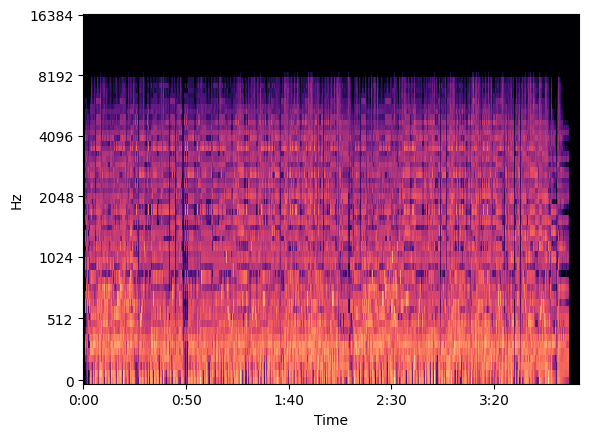

In [85]:
##### TO SAVE THE PLOT #####
# METHOD 1
fig = plt.Figure(figsize=(8,8), dpi=128, frameon=False)
canvas = FigureCanvas(fig)
ax = fig.add_subplot(111)
ax.axes.get_xaxis().set_visible(False)
ax.axes.get_yaxis().set_visible(False)
ax.set_frame_on(False)
librosa.display.specshow(mel_spectrogram_db, sr=sr, x_axis='time', y_axis='mel',hop_length=hop_length)
fig.savefig('./'+str(1)+'.png', bbox_inches='tight', pad_inches=0, dpi=128)


# METHOD 2
def scale_minmax(X, min=0.0, max=1.0):
    X_std = (X - X.min()) / (X.max() - X.min())
    X_scaled = X_std * (max - min) + min
    return X_scaled

def spectrogram_image(mel_spectrogram_db, out):

    # min-max scale to fit inside 8-bit range
    img = scale_minmax(mel_spectrogram_db , 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image
    img = 255-img # invert. make black==more energy

    # save as PNG
    #skimage.io.imsave(out, img)

# convert to PNG
out = 'out.png'
spectrogram_image(mel_spectrogram_db, out=out)
print('wrote file', out)

In [86]:
!pip instal skimage

ERROR: unknown command "instal" - maybe you meant "install"


NameError: name 'features' is not defined

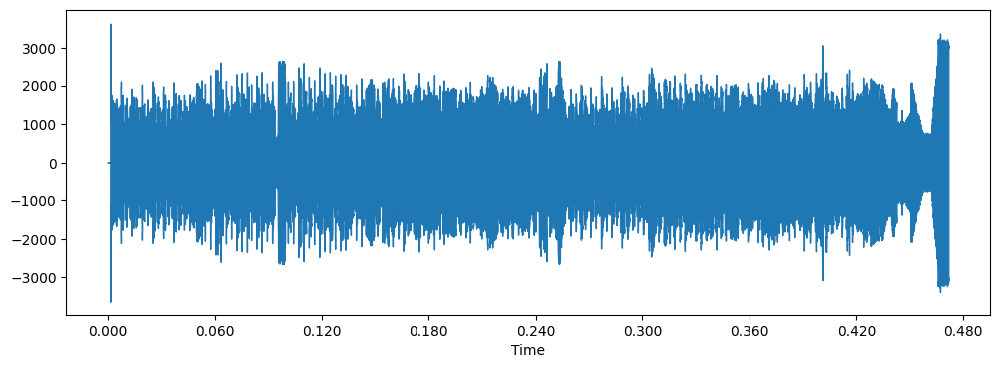

In [88]:

def extract_features(audio_file):
    # Load the audio file
    audio_data, sample_rate = librosa.load(audio_file)

    #spectral centroid -- centre of mass -- weighted mean of the frequencies present in the sound
    spectral_centroids = librosa.feature.spectral_centroid(y=audio_data, sr=sample_rate)
    spectral_centroids.shape
    # Computing the time variable for visualization
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)
    # Normalising the spectral centroid for visualisation
    #def normalize(audio_data, axis=0):
        #return sklearn.preprocessing.minmax_scale(audio_data, axis=axis)
    #Plotting the Spectral Centroid along the waveform
    plt.figure(figsize=(12, 4))
    librosa.display.waveshow(spectral_centroids, sr=sample_rate)

    return features
# Example usage
audio_file = '/Users/odysseaslazaridis/Documents/GroupProject/babyslakh_16k/Track00001/mix.wav'
extracted_features = extract_features(audio_file)
print(extracted_features)


# BAND ENERGY RATIO

In [112]:
def calculate_split_frequency_bin(split_frequency, sample_rate, num_frequency_bins):
    """Infer the frequency bin associated to a given split frequency."""
    
    frequency_range = sample_rate / 2
    frequency_delta_per_bin = frequency_range / num_frequency_bins
    split_frequency_bin = math.floor(split_frequency / frequency_delta_per_bin)
    return int(split_frequency_bin)

In [126]:
def band_energy_ratio(spectrogram, split_frequency, sample_rate):
    """Calculate band energy ratio with a given split frequency."""
    
    split_frequency_bin = calculate_split_frequency_bin(split_frequency, sample_rate, len(spectrogram[0]))
    print("the split frequency is " +str(split_frequency_bin) )
    band_energy_ratio = []
    
    # calculate power spectrogram
    power_spectrogram = np.abs(spectrogram) ** 2
    print(power_spectrogram)
    # calculate BER value for each frame
    for frame in power_spectrogram:
        sum_power_low_frequencies = frame[:split_frequency_bin].sum()
        print(frame[:split_frequency_bin])
        sum_power_high_frequencies = frame[split_frequency_bin:].sum()
        print(str(sum_power_high_frequencies))
        band_energy_ratio_current_frame = sum_power_low_frequencies / sum_power_high_frequencies
        band_energy_ratio.append(band_energy_ratio_current_frame)
    
    return np.array(band_energy_ratio)

In [148]:
# load audio files with librosa
y_bass, sr = librosa.load('/Users/odysseaslazaridis/Documents/GroupProject/babyslakh_16k/Track00001/stems/S03.wav', sr=32000)
y_guitar, sr = librosa.load('/Users/odysseaslazaridis/Documents/GroupProject/babyslakh_16k/Track00001/stems/S07.wav', sr=32000)

In [164]:
FRAME_SIZE = 2048
HOP_SIZE = 512

    
spec_guitar = librosa.stft(y_guitar, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
ber_guitar = band_energy_ratio(spec_guitar, 2000, sr)

spec_bass = librosa.stft(y_bass, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
ber_bass = band_energy_ratio(spec_bass, 2000, sr)

the split frequency is 1887
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[0. 0. 0. ... 0. 0. 0.]
13.647435
[0. 0. 0. ... 0. 0. 0.]
4.693145
[0. 0. 0. ... 0. 0. 0.]
2.4023535
[0. 0. 0. ... 0. 0. 0.]
37.585636
[0. 0. 0. ... 0. 0. 0.]
156.25922
[0. 0. 0. ... 0. 0. 0.]
201.2267
[0. 0. 0. ... 0. 0. 0.]
141.59195
[0. 0. 0. ... 0. 0. 0.]
241.88016
[0. 0. 0. ... 0. 0. 0.]
1666.4111
[0. 0. 0. ... 0. 0. 0.]
2740.3582
[0. 0. 0. ... 0. 0. 0.]
12568.172
[0. 0. 0. ... 0. 0. 0.]
12853.748
[0. 0. 0. ... 0. 0. 0.]
6108.6597
[0. 0. 0. ... 0. 0. 0.]
5991.859
[0. 0. 0. ... 0. 0. 0.]
9308.256
[0. 0. 0. ... 0. 0. 0.]
12486.985
[0. 0. 0. ... 0. 0. 0.]
15204.955
[0. 0. 0. ... 0. 0. 0.]
18038.324
[0. 0. 0. ... 0. 0. 0.]
19758.043
[0. 0. 0. ... 0. 0. 0.]
31023.379
[0. 0. 0. ... 0. 0. 0.]
24789.684
[0. 0. 0. ... 0. 0. 0.]
40501.508
[0. 0. 0. ... 0. 0. 0.]
23319.68
[0. 0. 0. ... 0. 0. 0.]
7805.831
[0. 0.

In [165]:
ber.max()

0.46147725

# Visualise Band energy ratio

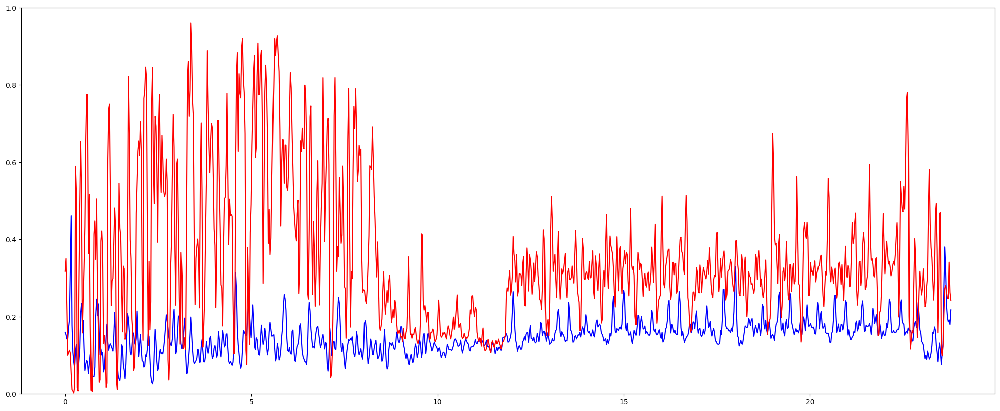

In [166]:
frames = range(len(ber_bass))
t = librosa.frames_to_time(frames, hop_length=HOP_SIZE)
plt.figure(figsize=(25, 10))

plt.plot(t, ber_bass, color="b")
plt.plot(t, ber_guitar, color="r")
plt.ylim((0, 1))
plt.show()